In [1]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import open3d as o3d
from mask_generator import create_mask_generator

from lang_sam import LangSAM

# Set up matplotlib for better visualization
plt.rcParams['figure.figsize'] = (20, 6)
plt.rcParams['font.size'] = 12


SAMPLE_INDICE = 6
CROP_AREA_PERCENTAGE = 0.15


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Pre Process Data

In [2]:
# utils

def crop_tensor_by_percentage(tensor, crop_percent=0.1):
    """
    Crops a tensor (C, H, W) or (H, W) by a percentage from each side.
    crop_percent: float or tuple (left/right, top/bottom) as fraction of width/height to crop from each side.
    """
    if isinstance(crop_percent, float):
        crop_w = crop_percent
        crop_h = crop_percent
    elif isinstance(crop_percent, (tuple, list)) and len(crop_percent) == 2:
        crop_w, crop_h = crop_percent
    else:
        raise ValueError("crop_percent must be float or tuple of two floats")
    if tensor.ndim == 3:
        c, h, w = tensor.shape
    elif tensor.ndim == 2:
        h, w = tensor.shape
    else:
        raise ValueError("Tensor must be 2D or 3D")
    left = int(w * crop_w)
    right = w - int(w * crop_w)
    top = int(h * crop_h)
    bottom = h - int(h * crop_h)
    if tensor.ndim == 3:
        return tensor[:, top:bottom, left:right]
    else:
        return tensor[top:bottom, left:right]

def crop_pil_image_by_percentage(image_pil, crop_percent=0.1):
    """
    Crops a PIL Image by a percentage from each side.
    crop_percent: float or tuple (left/right, top/bottom) as fraction of width/height to crop from each side.
    """
    if isinstance(crop_percent, float):
        crop_w = crop_percent
        crop_h = crop_percent
    elif isinstance(crop_percent, (tuple, list)) and len(crop_percent) == 2:
        crop_w, crop_h = crop_percent
    else:
        raise ValueError("crop_percent must be float or tuple of two floats")
    w, h = image_pil.size
    left = int(w * crop_w)
    right = w - int(w * crop_w)
    top = int(h * crop_h)
    bottom = h - int(h * crop_h)
    return image_pil.crop((left, top, right, bottom))

def load_rgb_image(image_path, crop_percent=None):
    """Load RGB image and convert to tensor format (3, H, W)"""
    # Load image using PIL
    img = Image.open(image_path)
    img_array = np.array(img)
    
    # Convert from HWC to CHW format
    if len(img_array.shape) == 3:
        img_tensor = torch.from_numpy(img_array.transpose(2, 0, 1))
    else:
        img_tensor = torch.from_numpy(img_array)
    
    image_pil = Image.open(image_path).convert("RGB")

    if crop_percent is not None:
        image_pil = crop_pil_image_by_percentage(image_pil, crop_percent)
        img_tensor = crop_tensor_by_percentage(img_tensor, crop_percent)

    return img_tensor, image_pil

def load_depth_image(image_path, crop_percent=None):
    """Load depth image and convert to tensor format (H, W)"""
    # Load depth image
    depth_img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    
    # Convert to float tensor
    depth_tensor = torch.from_numpy(depth_img).float()

    if crop_percent is not None:
        depth_tensor = crop_tensor_by_percentage(depth_tensor, crop_percent)
    
    return depth_tensor

def compute_normals_from_depth(depth_tensor, intrinsic_matrix=None):
    """
    Compute surface normals from depth image using OpenCV Sobel operators.
    
    Args:
        depth_tensor: torch.Tensor of shape (H, W) - depth values
        intrinsic_matrix: torch.Tensor of shape (3, 3) - camera intrinsic matrix
                         If None, uses default values
    
    Returns:
        normals_tensor: torch.Tensor of shape (3, H, W) - surface normals
    """
    depth_np = depth_tensor.numpy()
    height, width = depth_np.shape
    
    # Default intrinsic parameters if not provided
    if intrinsic_matrix is None:
        # These are example values - you should replace with your actual camera intrinsics
        fx, fy = 525.0, 525.0  # Focal lengths
        cx, cy = width/2, height/2  # Principal points (center of image)
    else:
        intrinsic_np = intrinsic_matrix.numpy()
        fx, fy = intrinsic_np[0, 0], intrinsic_np[1, 1]
        cx, cy = intrinsic_np[0, 2], intrinsic_np[1, 2]
    
    # Method 1: Using OpenCV Sobel operators (faster)
    # Compute gradients
    dzdx = cv2.Sobel(depth_np, cv2.CV_64F, 1, 0, ksize=5)
    dzdy = cv2.Sobel(depth_np, cv2.CV_64F, 0, 1, ksize=5)
    
    # Compute normals using gradients
    # Normal = (-dz/dx, -dz/dy, 1) normalized
    normals = np.dstack((-dzdx, -dzdy, np.ones_like(depth_np)))
    
    # Normalize to unit vectors
    norms = np.linalg.norm(normals, axis=2, keepdims=True)
    norms[norms == 0] = 1  # Avoid division by zero
    normals = normals / norms
    
    # Convert to CHW format (3, H, W)
    normals_tensor = torch.from_numpy(normals.transpose(2, 0, 1)).float()
    
    return normals_tensor


In [3]:
# visualize

def visualize_predicted_masks(image_pil, results):
    """
    Visualize the image and all predicted masks with unique colors and legend.

    Args:
        image_pil: PIL.Image - the input image
        results: list of dicts - each dict should have a "masks" key with a list of masks (numpy or torch.Tensor)
    """
    import matplotlib.pyplot as plt
    import numpy as np

    num_masks = 0
    if results and "masks" in results[0] and results[0]["masks"] is not None:
        num_masks = len(results[0]["masks"])

    if num_masks > 0:
        from matplotlib import cm
        from matplotlib.patches import Patch

        colormap = cm.get_cmap('tab10', num_masks)
        mask_colors = [colormap(i) for i in range(num_masks)]

        fig, ax = plt.subplots(1, 1, figsize=(8, 8))
        ax.imshow(np.array(image_pil))
        ax.set_title("All Masks Overlayed")
        ax.axis("off")

        for i, mask in enumerate(results[0]["masks"]):
            if hasattr(mask, 'cpu'):
                mask = mask.cpu().numpy()
            # Create a colored mask with alpha
            colored_mask = np.zeros((*mask.shape, 4))
            colored_mask[..., :3] = mask_colors[i][:3]  # RGB
            colored_mask[..., 3] = mask * 0.5           # Alpha only where mask==1

            ax.imshow(colored_mask)

            # Find the centroid of the mask for labeling
            ys, xs = np.where(mask)
            if len(xs) > 0 and len(ys) > 0:
                centroid_x = int(xs.mean())
                centroid_y = int(ys.mean())
                ax.text(centroid_x, centroid_y, f"Mask {i+1}", color='white', fontsize=14,
                        ha='center', va='center', bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.2'))

        # Add legend for mask colors
        legend_handles = [Patch(color=mask_colors[i], label=f"Mask {i+1}") for i in range(num_masks)]
        ax.legend(handles=legend_handles, loc='upper right', bbox_to_anchor=(1.15, 1.0))

    else:
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        ax.imshow(np.array(image_pil))
        ax.set_title("No mask found")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

def visualize_rgb_depth_normals(rgb_tensor, depth_tensor, normals_tensor, sample_idx=0):
    """
    Visualize RGB, depth, and surface normals for a sample.

    Args:
        rgb_tensor (torch.Tensor or np.ndarray): (3, H, W) RGB image tensor.
        depth_tensor (torch.Tensor or np.ndarray): (H, W) depth image tensor.
        normals_tensor (torch.Tensor or np.ndarray): (3, H, W) surface normals tensor.
        sample_idx (int): Index of the sample (for title display).
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Convert tensors to numpy if needed
    if hasattr(rgb_tensor, "detach"):
        rgb_np = rgb_tensor.detach().cpu().permute(1, 2, 0).numpy()
    else:
        rgb_np = np.transpose(rgb_tensor, (1, 2, 0))
    if hasattr(depth_tensor, "detach"):
        depth_np = depth_tensor.detach().cpu().numpy()
    else:
        depth_np = depth_tensor
    if hasattr(normals_tensor, "detach"):
        normals_np = normals_tensor.detach().cpu().permute(1, 2, 0).numpy()
    else:
        normals_np = np.transpose(normals_tensor, (1, 2, 0))

    # Normalize RGB to 0-1 if needed
    if rgb_np.max() > 1.0:
        rgb_np = rgb_np / 255.0

    # Normalize normals to [0, 1] for visualization
    normals_vis = (normals_np + 1) / 2

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    axes[0].imshow(rgb_np)
    axes[0].set_title(f'RGB Image - Sample {sample_idx}')
    axes[0].axis('off')

    im1 = axes[1].imshow(depth_np, cmap='viridis')
    axes[1].set_title(f'Depth Image - Sample {sample_idx}')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], label='Depth Value')

    axes[2].imshow(normals_vis)
    axes[2].set_title(f'Surface Normals - Sample {sample_idx}')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


In [4]:
intrinsic_matrix = torch.tensor([
    [5.99027979e+03, 0.00000000e+00, 2.25877563e+03],
    [0.00000000e+00, 5.98936230e+03, 2.23563940e+03],
    [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]
]).float()
intrinsic = intrinsic_matrix

In [5]:
# Set data directory
data_dir = '/home/rd-machine/rafay-ws/autoregressive-bbox/autoreg-bbox/custom_data'

# Device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Find all available samples
rgb_files = [f for f in os.listdir(data_dir) if f.startswith('capture_rgb_') and f.endswith('.png')]
sample_indices = sorted([int(f.split('_')[-1].split('.')[0]) for f in rgb_files])

print(f"Found {len(sample_indices)} RGB samples: {sample_indices}")
print(f"Available samples: {sample_indices}")

sample_idx = sample_indices[SAMPLE_INDICE]
rgb_path = os.path.join(data_dir, f'capture_rgb_{sample_idx}.png')
depth_path = os.path.join(data_dir, f'capture_depth_{sample_idx}.png')

Using device: cuda
Found 10 RGB samples: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
Available samples: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [6]:
# Load images
rgb_tensor, pil_image = load_rgb_image(rgb_path, crop_percent=CROP_AREA_PERCENTAGE)
depth_tensor = load_depth_image(depth_path, crop_percent=CROP_AREA_PERCENTAGE)

# Compute normals from depth
print("Computing surface normals...")
normals_tensor = compute_normals_from_depth(depth_tensor, intrinsic_matrix)

# Compute masks
model_sam = LangSAM()
text_prompt = 'all objects'
masks = model_sam.predict([pil_image], [text_prompt])




Computing surface normals...
One or both local paths not provided. Loading from Hugging Face Hub: IDEA-Research/grounding-dino-base


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Predicting 1 masks
Predicted 1 masks


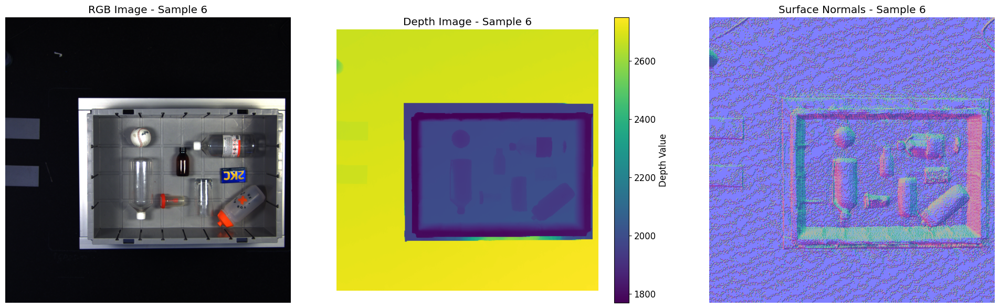

In [7]:
# Visualize RGB, depth, and normals
visualize_rgb_depth_normals(rgb_tensor, depth_tensor, normals_tensor, sample_idx=SAMPLE_INDICE)

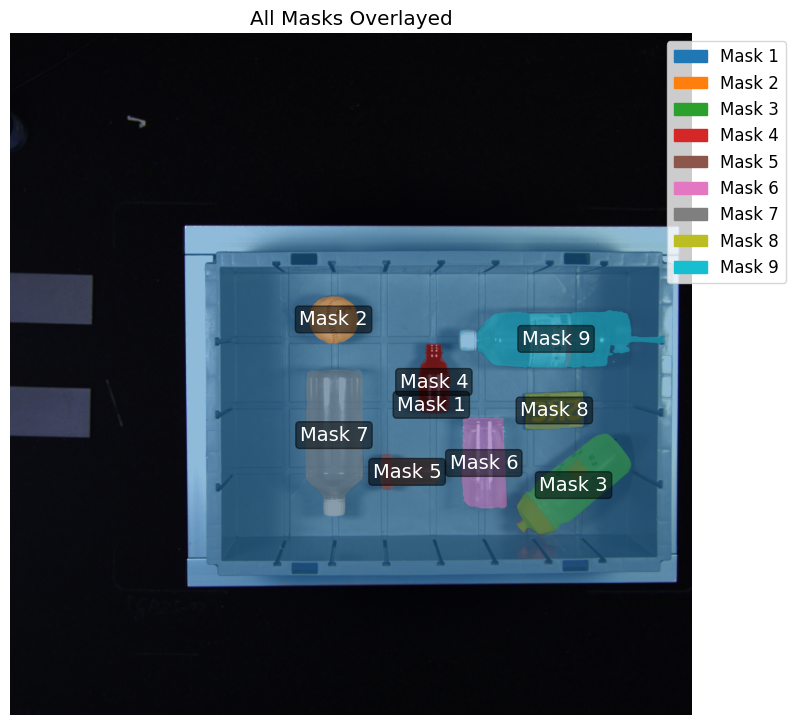

In [8]:
# Visualize the predicted masks
visualize_predicted_masks(pil_image, masks)

In [9]:
del model_sam


In [10]:
# Extract binary masks from the SAM2 output dictionary
# The expected output is a numpy array of shape (N_objects, H, W), dtype=bool or uint8
if isinstance(masks, list) and len(masks) > 0 and isinstance(masks[0], dict) and 'masks' in masks[0]:
    sam2_masks = masks[0]['masks']  # shape: (N_objects, H, W), dtype=float32
    # Convert to binary masks (bool or uint8)
    binary_masks = (sam2_masks > 0.5).astype(np.uint8)
    print("binary_masks shape:", binary_masks.shape, "dtype:", binary_masks.dtype)
else:
    print("Could not extract masks in expected format. Got:", type(masks))

binary_masks shape: (9, 3154, 3154) dtype: uint8


# Inference

In [11]:
# Define imports and set global variables.

import torch
import numpy as np

import os.path as osp
from easydict import EasyDict
from model import BoundingBox3dV3QuantEulerNoRGB
from bbox3d_utils import depth2cloud, sample_bbox, quant_pc, quantile_box, masks_to_boxes, quaternions_to_rotmats, get_transforms_from_rotmats_and_translations, BatchBBox3D
import matplotlib.pyplot as plt


import torch
import numpy as np
import plotly.graph_objects as go

In [12]:
def depth_to_pointcloud(depth, rgb, intrinsic, max_points=200000):
    """
    depth: (H, W) torch
    rgb: (3, H, W) torch
    intrinsic: (3, 3) torch
    """
    H, W = depth.shape
    fx, fy = intrinsic[0,0], intrinsic[1,1]
    cx, cy = intrinsic[0,2], intrinsic[1,2]

    y, x = torch.meshgrid(torch.arange(H), torch.arange(W), indexing="ij")
    x = x.to(depth.device).float()
    y = y.to(depth.device).float()

    Z = depth
    X = (x - cx) * Z / fx
    Y = (y - cy) * Z / fy

    points = torch.stack((X, Y, Z), dim=-1).reshape(-1, 3)
    colors = rgb.permute(1,2,0).reshape(-1,3).cpu().numpy() / 255.0

    points = points.cpu().numpy()

    # Random downsample for speed
    if len(points) > max_points:
        idx = np.random.choice(len(points), max_points, replace=False)
        points, colors = points[idx], colors[idx]

    return points, colors

def get_3d_box(center, dims, rotmat):
    """
    center: (3,)
    dims: (3,)  (dx, dy, dz)
    rotmat: (3,3)
    """
    dx, dy, dz = dims / 2.0
    corners = np.array([
        [-dx, -dy, -dz],
        [ dx, -dy, -dz],
        [ dx,  dy, -dz],
        [-dx,  dy, -dz],
        [-dx, -dy,  dz],
        [ dx, -dy,  dz],
        [ dx,  dy,  dz],
        [-dx,  dy,  dz],
    ])
    corners = (rotmat @ corners.T).T + center
    return corners

def plot_pointcloud_with_boxes_plotly(points, colors, centers, dims, rotmats):
    # Scatter point cloud
    fig = go.Figure(data=[
        go.Scatter3d(
            x=points[:,0], y=points[:,1], z=points[:,2],
            mode='markers',
            marker=dict(size=1, color=['rgb({},{},{})'.format(int(r*255),int(g*255),int(b*255)) 
                                       for r,g,b in colors]),
            name="PointCloud"
        )
    ])

    # Add boxes
    for c, d, R in zip(centers, dims, rotmats):
        box = get_3d_box(c, d, R)
        edges = [
            [0,1],[1,2],[2,3],[3,0],
            [4,5],[5,6],[6,7],[7,4],
            [0,4],[1,5],[2,6],[3,7]
        ]
        for e in edges:
            fig.add_trace(go.Scatter3d(
                x=[box[e[0],0], box[e[1],0]],
                y=[box[e[0],1], box[e[1],1]],
                z=[box[e[0],2], box[e[1],2]],
                mode="lines",
                line=dict(color="red", width=5),
                name="Box"
            ))

    fig.update_layout(scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ))
    fig.show()

In [13]:
import plotly.graph_objects as go
import numpy as np

def plot_pointcloud_with_boxes_plotly(points, colors, centers, dims, rotmats):
    # Scatter point cloud
    fig = go.Figure(data=[
        go.Scatter3d(
            x=points[:,0], y=points[:,1], z=points[:,2],
            mode='markers',
            marker=dict(
                size=1,
                color=['rgb({},{},{})'.format(int(r*255),int(g*255),int(b*255)) 
                       for r,g,b in colors]
            ),
            name="PointCloud"
        )
    ])

    # Add boxes
    for i, (c, d, R) in enumerate(zip(centers, dims, rotmats)):
        box = get_3d_box(c, d, R)
        edges = [
            [0,1],[1,2],[2,3],[3,0],
            [4,5],[5,6],[6,7],[7,4],
            [0,4],[1,5],[2,6],[3,7]
        ]
        for j, e in enumerate(edges):
            fig.add_trace(go.Scatter3d(
                x=[box[e[0],0], box[e[1],0]],
                y=[box[e[0],1], box[e[1],1]],
                z=[box[e[0],2], box[e[1],2]],
                mode="lines",
                line=dict(color="red", width=3),
                showlegend=(i==0 and j==0),  # Only show legend for first edge of first box
                name="Box"
            ))

    fig.update_layout(scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ))
    fig.show()

In [14]:

# What device to use, e.g. 'cpu' or 'cuda'.
DEVICE = 'cuda'

# The path to the weight checkpoint.
MODEL_SNAPSHOT_PATH = 'cheakpoints/model_ckpt_itr_11000.pth'

# inference params
INFERENCE_MODE = 'quantile_box' # should be either `quantile_box` or `beam`

# quantile box params
N_SAMPLES = 120 # only used if `INFERENCE_MODE` is `quantile_box`
QUANTILE = 0.25
GRID_SIZE = 12

# beam search params
N_BEAMS = 60 # only used if `INFERENCE_MODE` is `beam` 

# Define the model hyperparameters corresponding to the model checkpoint.
cfg = EasyDict(
    DISTRIBUTED=False,
    QUANT_PARAMS=EasyDict(
        LENGTH=[0.0, 11.0, 512],
        OFFSET=[-8.0, 11.0, 512],
        EULER=[[0, np.pi * 2, 512], [0, np.pi, 512], [0, np.pi * 2, 512]],
        LENGTH_SLICE=slice(0, 3),
        OFFSET_SLICE=slice(3, 6),
        EULER_SLICE=slice(6, 9),
    ),
)
model = BoundingBox3dV3QuantEulerNoRGB(cfg).to(device=DEVICE)


# Load the weights
state_dict =  torch.load(MODEL_SNAPSHOT_PATH, map_location=torch.device(DEVICE))
model.load_state_dict(state_dict)

<All keys matched successfully>

In [15]:
# inference step
from time import time

start_time = time()

mask_full = torch.from_numpy(binary_masks).to(device=DEVICE)
mask_occ = torch.from_numpy(binary_masks).to(device=DEVICE)
rgb_tensor = rgb_tensor.to(device=DEVICE)
depth_tensor = depth_tensor.to(device=DEVICE)
normals_tensor = normals_tensor.to(device=DEVICE)
intrinsic_matrix = intrinsic_matrix.to(device=DEVICE)   

point_cloud = depth2cloud(depth_tensor, intrinsic_matrix, rgb_tensor.shape[-2], rgb_tensor.shape[-1])[0].transpose(2, 1).transpose(1, 0)
mask_full_sum = mask_full.float().sum(dim=(1, 2))
occ_ratio = 1 - mask_occ.float().sum(dim=(1, 2)) / mask_full_sum

keep_indices = occ_ratio < 0.92 # we only want to predict objects that not totally occluded which is out of scope of the model.

model_inputs = dict(
    rgbs=rgb_tensor, #None
    im_size=torch.tensor([rgb_tensor.shape[-2], rgb_tensor.shape[-1]]).to(device=DEVICE),
    point_cloud=point_cloud,
    normals_pred= normals_tensor, #None
    boxes=masks_to_boxes(mask_full)[keep_indices],
    segm_feats=None, #None
    depth_feats= depth_tensor, #None
    mask_occ=mask_occ[keep_indices],
    mask_full=mask_full[keep_indices],
    depth_valid=torch.ones_like(depth_tensor),
    depth_uncertainty=torch.ones_like(depth_tensor),
    occ_ratio=occ_ratio,
    bin_probs=torch.zeros(rgb_tensor.shape[-2], rgb_tensor.shape[-1]).to(device=DEVICE)
)
blobs = model.predict(
    **model_inputs
)
lengths, pos, quat, ent, logps = sample_bbox(
    blobs['feats'],
    blobs['ranges_patches'],
    blobs['means_patches'],
    N_SAMPLES if INFERENCE_MODE == 'quantile_box' else N_BEAMS,
    "random" if INFERENCE_MODE == 'quantile_box' else "beam",
    model.quant_order,
    model.autoreg,
    model.length_slice,
    model.offset_slice,
    model.euler_slice,
)
if INFERENCE_MODE == 'quantile_box':
    all_points, mean_inter, quat =  quant_pc(lengths, quat, pos, grid_size=GRID_SIZE)
    out = quantile_box(all_points, mean_inter, quat, quantile=QUANTILE)
elif INFERENCE_MODE == 'beam':
    out = dict(
            quat=quat[:, 0],
            dim=lengths[:, 0] * 2.0,
            position=pos[:, 0],
            logp=logps[:, 0]
        )
else:
    raise NotImplementedError(f"Inference mode {INFERENCE_MODE} is not implemented.")

valids = (
    torch.isfinite(out["dim"]).all(-1)
    & torch.isfinite(out["position"]).all(-1)
    & torch.isfinite(out["quat"]).all(-1)
)
boxes = BatchBBox3D(dimensions=out['dim'], poses=get_transforms_from_rotmats_and_translations(
                    rotmats=quaternions_to_rotmats(out["quat"]), translations=out["position"]
                ),valids=valids)
                

end_time = time()

print(f"Inference time: {end_time - start_time:.2f} seconds")


Inference time: 0.31 seconds


In [16]:
# Visualize 3D Bounding Boxes
points, colors = depth_to_pointcloud(depth_tensor, rgb_tensor, intrinsic_matrix, max_points=100000)


plot_pointcloud_with_boxes_plotly(points, colors,
                                  boxes.centers.cpu().numpy(),
                                  boxes.dimensions.cpu().numpy(),
                                  boxes.rotmats.cpu().numpy())

In [18]:
# Remove model from GPU after inference
del model
import gc
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

NameError: name 'model' is not defined